<a href="https://colab.research.google.com/github/007sanjib/My-test/blob/master/Project_8_Plant_Seedling_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Description – Image classification using CNNs in Keras
 
## Data Description:
You are provided with a dataset of images of plant seedlings at various stages of grown. Each image has a filename that is its unique id. The dataset comprises 12 plant species. The goal of the project is to create a classifier capable of determining a plant's species from a photo.

##Dataset:
The dataset can be download from Olympus. The data file names are:

 images.npy

 Label.csv

The original files are from Kaggle. Due to the large volume of data, the images were converted to images.npy file and the labels are also put into the Labels.csv. So that you can work on the data/project seamlessly without worrying about the high data volume.


Link to the Kaggle project site: https://www.kaggle.com/c/plant-seedlings-classification/data?select=train


## Context:
Can you differentiate a weed from a crop seedling?
The ability to do so effectively can mean better crop yields and better stewardship of the environment.
The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has recently released a dataset containing images of unique plants belonging to 12 species at several growth stages

## Objective:
To implement the techniques learnt as a part of the course.

## Learning Outcomes:

 Pre-processing of image data.

 Visualization of images.

 Building CNN.

 Evaluate the Model.

 The motive of the project is to make the learners capable to handle images/image classification problems, during this process you should also be capable to handle real image files, not just limited to a numpy array of image pixels.
Guide to solve the project seamlessly:
Here are the points which will help you to solve the problem efficiently:

 Read the problem statement carefully from start to end (including the note at the end). The highlighted part in the attached problem statement should not be missed.

 Download the dataset from the Olympus platform.

 Upload the "images.npy" and “Labels.csv” file to google drive.

 Then you can use the dataset path in the Google Colab notebook to do further steps related to project problem
statement.

 You can set runtime type to “GPU” in Google Colab, so that the code will run faster as you will be using CNN to fit your
model.

## Steps and tasks:
1. Import the libraries, load dataset, print shape of data, visualize the images in dataset. (5 Marks)
2. Data Pre-processing: (15 Marks)
  
  a. Normalization.
  b. Gaussian Blurring.
  c. Visualize data after pre-processing.
3. Make data compatible: (10 Marks)

  a. Convert labels to one-hot-vectors.
  
  b. Print the label for y_train[0].
  
  c. Split the dataset into training, testing, and validation set.
(Hint: First split images and labels into training and testing set with test_size = 0.3. Then further split test data
into test and validation set with test_size = 0.5)

  d. Check the shape of data, Reshape data into shapes compatible with Keras models if it’s not already. If it’s
already in the compatible shape, then comment in the notebook that it’s already in compatible shape.

4. Building CNN: (15 Marks)

  a. Define layers.
  
  b. Set optimizer and loss function. (Use Adam optimizer and categorical crossentropy.)

5. Fit and evaluate model and print confusion matrix. (10 Marks)
6. Visualize predictions for x_test[2], x_test[3], x_test[33], x_test[36], x_test[59]. (5 Marks)

## Note:

 Download the train images from the Olympus Platform.

 Do not download the dataset from Kaggle, as:

o The dataset is big.

o The dataset has 2 files for train and test images, but the labels are only for the train file. Test file has no
labels associated with it. So, when you want to know the accuracy of model on test images, there’s no way to measure it. That’s why the data provided to you on Olympus has only train images and their labels. For our purpose we use this for our training and testing and validation purpose.

Happy Learning!

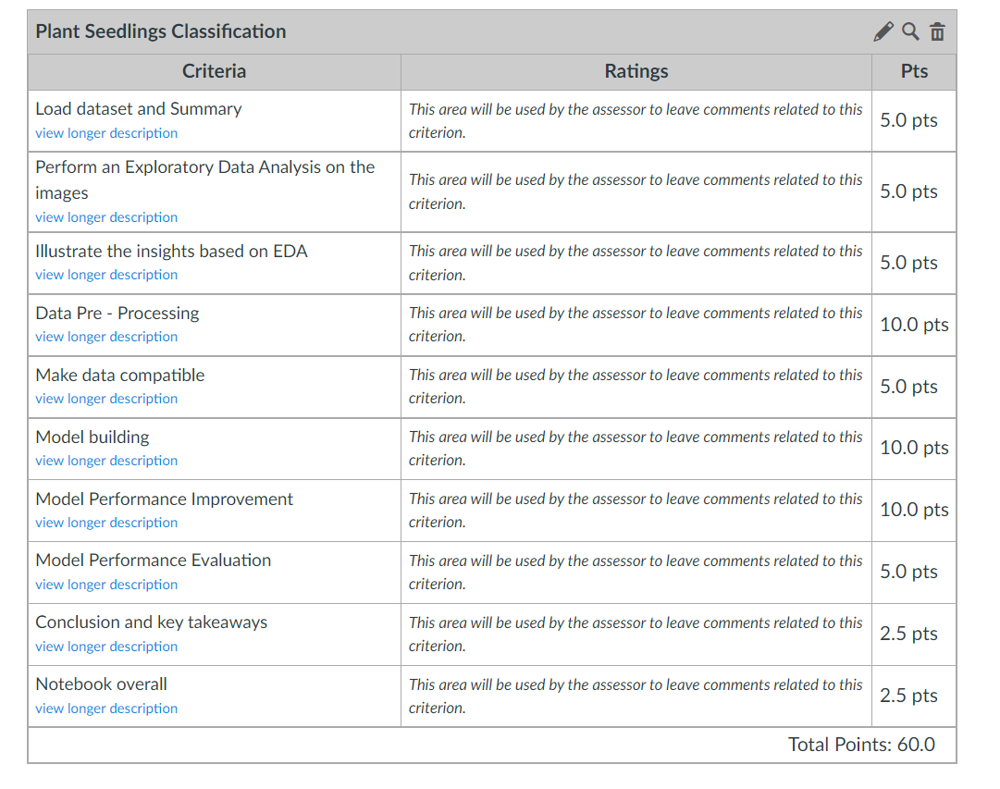

# Project Solution - The answer by Sanjib: 

Date : Oct-08-2021

Author : Sanjib K Basu

*Note: Google Colab provides Table of Contents on the left top menu*



# 1. Overview of the Dataset

In [94]:
# Import necessary libraries.
import cv2
from google.colab.patches import cv2_imshow

import os

import pandas as pd
import numpy as np

import copy

import seaborn as sns # for data visualization 
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential #sequential api for sequential model 
from tensorflow.keras.layers import Dense, Dropout, Flatten #importing different layers 
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Activation, Input, LeakyReLU,Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical #to perform one-hot encoding 
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
# from keras.optimizers import RMSprop,Adam #optimiers for optimizing the model
from keras.callbacks import EarlyStopping  #regularization method to prevent the overfitting
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import losses, optimizers

from tensorflow.keras.utils import to_categorical #to perform one-hot encoding 

import matplotlib.pyplot as plt

from matplotlib import pyplot as plt
%matplotlib inline

pd.set_option('display.max_colwidth', None) # prints the DataFrame cells with full text, none of its values truncated.
pd.set_option('display.max_columns', 100) # prints upto 100 columns
pd.set_option('display.max_rows', 200) # prints upto 200 rows
pd.set_option('display.colheader_justify', 'left') # dataframe column header left justified

pd.options.display.float_format = (
    "{:,.4f}".format
)  # format upto 4 decimals of float numbers


In [74]:
# mount the G drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [75]:
!ls drive/MyDrive/Colab\ Notebooks/UT-Austin/data


 images.npy
 Labels.csv
'Problem Statement - Plant Seedlings Image Classification using CNNs in Keras.pdf'


In [76]:
df_labels = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/UT-Austin/data/Labels.csv")

df_labels

,Label
0,Small-flowered Cranesbill
1,Small-flowered Cranesbill
2,Small-flowered Cranesbill
3,Small-flowered Cranesbill
4,Small-flowered Cranesbill
...,...
4745,Loose Silky-bent
4746,Loose Silky-bent
4747,Loose Silky-bent
4748,Loose Silky-bent


In [112]:
df_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4750 entries, 0 to 4749
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Label   4750 non-null   object
dtypes: object(1)
memory usage: 37.2+ KB


In [77]:

list(pd.unique(df_labels["Label"]))

['Small-flowered Cranesbill',
 'Fat Hen',
 'Shepherds Purse',
 'Common wheat',
 'Common Chickweed',
 'Charlock',
 'Cleavers',
 'Scentless Mayweed',
 'Sugar beet',
 'Maize',
 'Black-grass',
 'Loose Silky-bent']

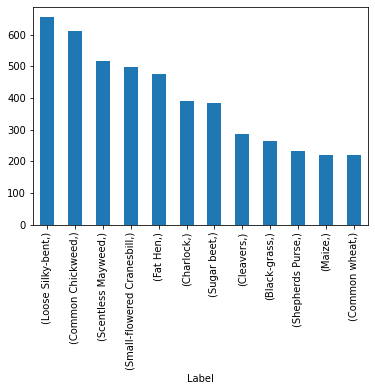

In [78]:
# [print(i) for i in list(pd.unique(df_labels["Label"]))]
df_labels.value_counts().plot(kind="bar")

In [79]:
df_labels.value_counts(normalize=True)

Label                    
Loose Silky-bent            0.1377
Common Chickweed            0.1286
Scentless Mayweed           0.1086
Small-flowered Cranesbill   0.1044
Fat Hen                     0.1000
Charlock                    0.0821
Sugar beet                  0.0811
Cleavers                    0.0604
Black-grass                 0.0554
Shepherds Purse             0.0486
Maize                       0.0465
Common wheat                0.0465
dtype: float64

### Observation by Sanjib:
1. 12 labels (classes) of little imbalance, lower magnitude.
2. Images are of same size, and colored RGB. 

In [80]:
img = np.load("/content/drive/MyDrive/Colab Notebooks/UT-Austin/data/images.npy")

In [81]:
img

array([[[[ 35,  52,  78],
         [ 36,  49,  76],
         [ 31,  45,  69],
         ...,
         [ 78,  95, 114],
         [ 76,  93, 110],
         [ 80,  95, 109]],

        [[ 33,  46,  68],
         [ 37,  50,  73],
         [ 48,  65,  83],
         ...,
         [ 81,  96, 113],
         [ 74,  89, 105],
         [ 83,  95, 109]],

        [[ 34,  50,  68],
         [ 35,  52,  72],
         [ 70,  85, 101],
         ...,
         [ 83,  97, 112],
         [ 79,  94, 108],
         [ 79,  94, 107]],

        ...,

        [[ 35,  50,  69],
         [ 42,  57,  73],
         [ 42,  57,  72],
         ...,
         [ 60,  76,  92],
         [ 67,  81,  97],
         [ 64,  77,  95]],

        [[ 36,  52,  67],
         [ 48,  63,  78],
         [ 41,  57,  73],
         ...,
         [ 44,  66,  83],
         [ 58,  76,  91],
         [ 57,  74,  90]],

        [[ 44,  58,  70],
         [ 43,  57,  73],
         [ 40,  55,  72],
         ...,
         [ 41,  70,  92],
        

In [82]:
img.shape 

(4750, 128, 128, 3)

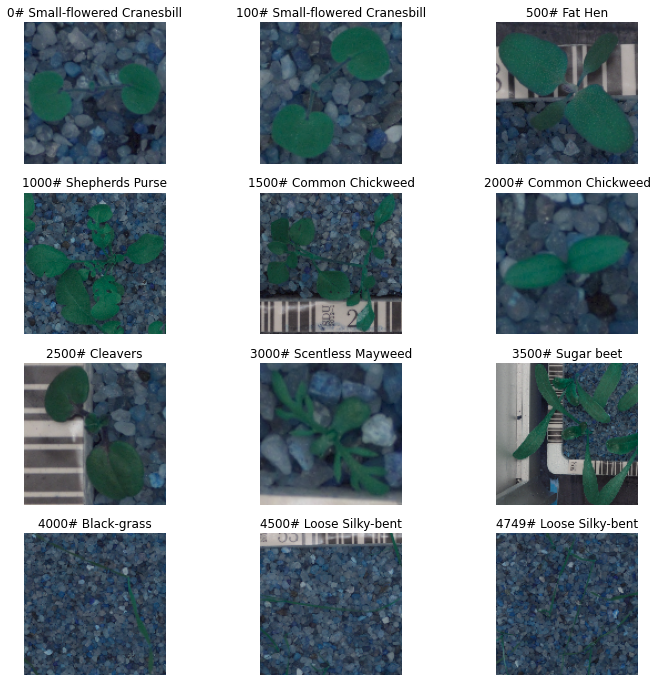

In [83]:
# df_labels.iloc[0]

fig = plt.figure(figsize = (12,12))

# ax = fig.add_subplot( 4, 3, i+1)
count = 0

# Plot random samples of 12 images
for i in [0, 100, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 4749]:
  # print(i,"="*40)
  count = count + 1 
  ax = fig.add_subplot(4, 3, count)
  plt.title(str(i) + "# " + df_labels.iloc[i,0])
  plt.axis('off')
  plt.imshow(img[i])


plt.show()

#2. Exploratory Data Analysis

Printing images of Cleavers
Indices of plant-image Cleavers are in the range : 2424 2710 . Samples:
[2427 2433 2436 2451 2456 2457 2477 2482 2502 2504 2517 2533 2545 2560
 2584 2592 2656 2662 2665 2710]


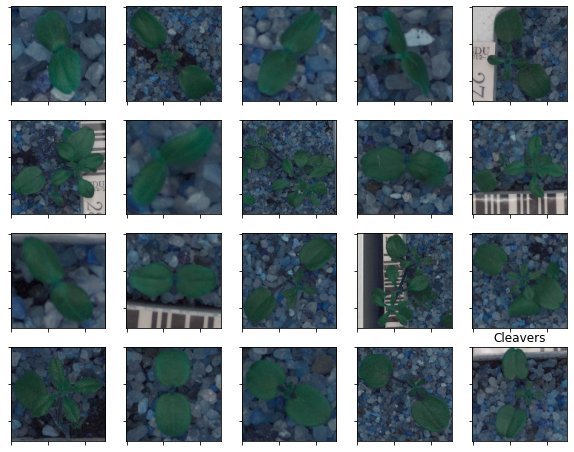

CPU times: user 2.34 s, sys: 53 ms, total: 2.39 s
Wall time: 2.38 s


In [84]:
%%time

# Reusable function

def plot_for_class(label, df_labels, img, 
                   no_rows = 4, no_cols = 5):
    
    """
      Description:
        For a given class (plant type), the function displays
        number of sample images, in a grid of nb_rows and
        nb_cols 

      Parameters: 
        label : str = The class (plant type)
        df_ladels : pd.DataFrame = The label (class) of each image
        img : np.array = The array of images
        no_rows : int = The number of rows in display grid
        no_cols : int = The number of columns in display grid

      Returns:
        None (display only)
    """
    print("Printing images of", label)

    fig, axs = plt.subplots(no_rows, no_cols, figsize=(10, 8))

    label_indexes = df_labels[ df_labels["Label"] == label ].index
    print("Indices of plant-image",label,
          "are in the range :",np.amin(label_indexes), 
          np.amax(label_indexes), ". Samples:")
    # pick random samples
    label_indexes = np.random.choice(label_indexes,
                                     no_rows * no_cols)
    label_indexes = np.sort(label_indexes)
    print(label_indexes)

    
    n = 0
    for i in range(0, no_rows):
        for j in range(0, no_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            
            axs[i, j].imshow(img[label_indexes[n]])
            n += 1  
    plt.title(label)
    plt.show()        

# Testing the function
plot_for_class("Cleavers", df_labels, img)

Printing images of Small-flowered Cranesbill
Indices of plant-image Small-flowered Cranesbill are in the range : 0 495 . Samples:
[ 10  13  51  53  55 108 110 123 146 199 201 224 252 272 289 298 315 350
 400 459]


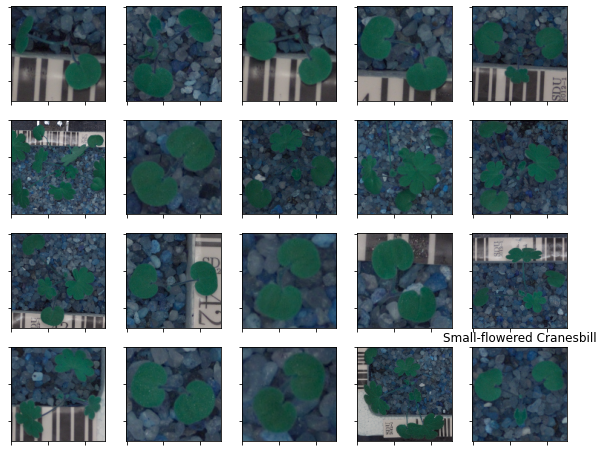

Printing images of Fat Hen
Indices of plant-image Fat Hen are in the range : 496 970 . Samples:
[545 547 547 590 652 669 672 747 781 786 799 805 806 817 827 836 872 899
 921 928]


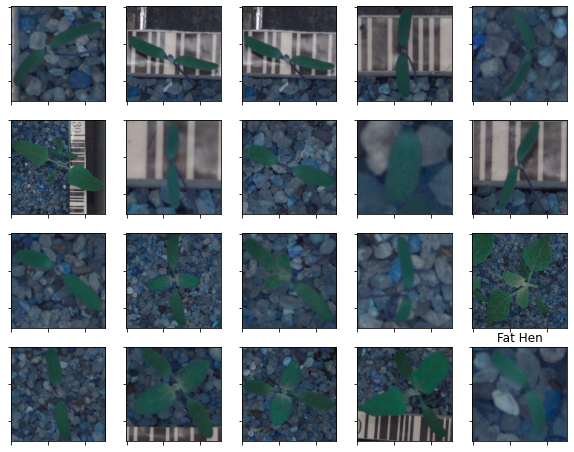

Printing images of Shepherds Purse
Indices of plant-image Shepherds Purse are in the range : 971 1201 . Samples:
[ 977  980  990 1000 1017 1020 1022 1035 1039 1040 1050 1059 1076 1076
 1144 1170 1179 1179 1189 1200]


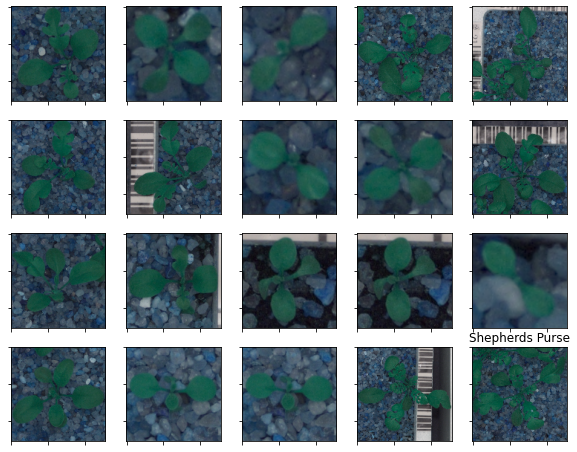

Printing images of Common wheat
Indices of plant-image Common wheat are in the range : 1202 1422 . Samples:
[1225 1226 1240 1247 1256 1268 1282 1288 1290 1294 1300 1308 1309 1317
 1333 1339 1349 1400 1418 1421]


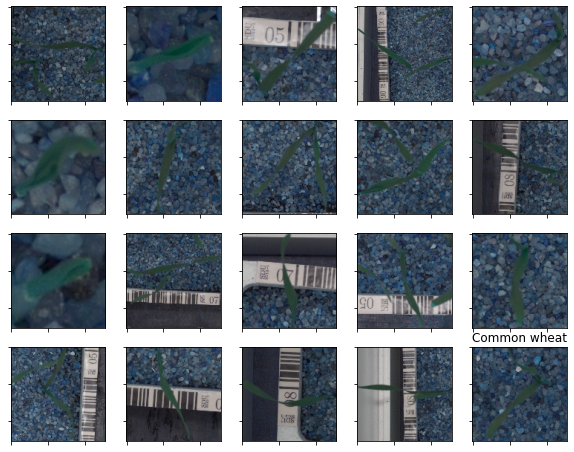

Printing images of Common Chickweed
Indices of plant-image Common Chickweed are in the range : 1423 2033 . Samples:
[1509 1556 1557 1583 1596 1662 1679 1735 1744 1744 1766 1770 1799 1873
 1901 1908 1925 1949 1952 2013]


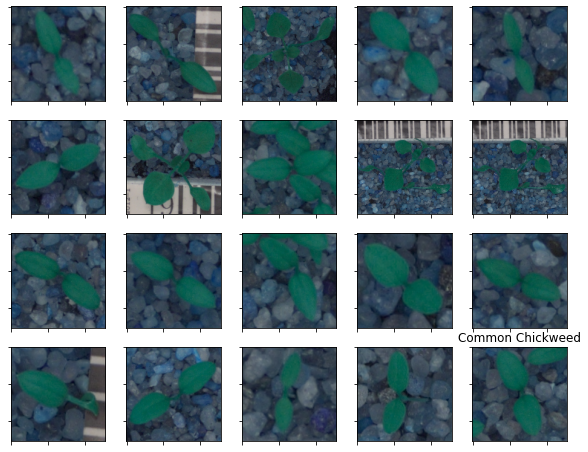

Printing images of Charlock
Indices of plant-image Charlock are in the range : 2034 2423 . Samples:
[2057 2097 2115 2143 2175 2193 2196 2202 2206 2217 2257 2299 2324 2360
 2364 2364 2376 2385 2387 2399]


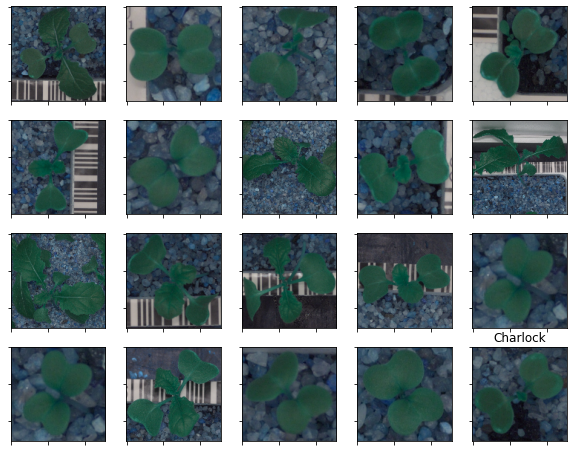

Printing images of Cleavers
Indices of plant-image Cleavers are in the range : 2424 2710 . Samples:
[2441 2442 2477 2491 2492 2502 2511 2569 2600 2611 2613 2623 2626 2632
 2641 2645 2660 2671 2696 2708]


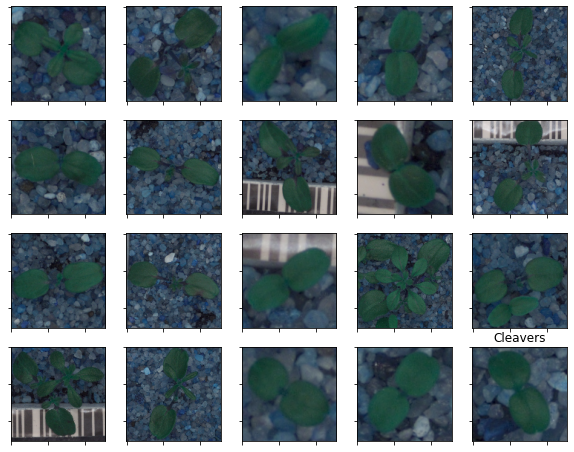

Printing images of Scentless Mayweed
Indices of plant-image Scentless Mayweed are in the range : 2711 3226 . Samples:
[2723 2749 2750 2756 2759 2840 2879 2928 2952 2970 2986 2988 3006 3011
 3033 3111 3147 3156 3190 3197]


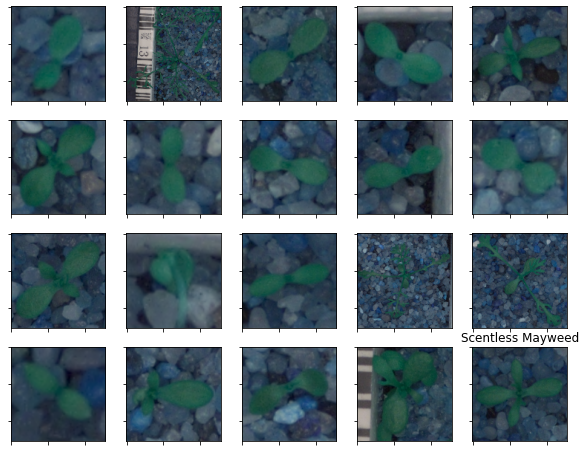

Printing images of Sugar beet
Indices of plant-image Sugar beet are in the range : 3227 3611 . Samples:
[3230 3259 3269 3281 3290 3316 3323 3340 3361 3361 3394 3400 3402 3418
 3427 3449 3483 3548 3565 3591]


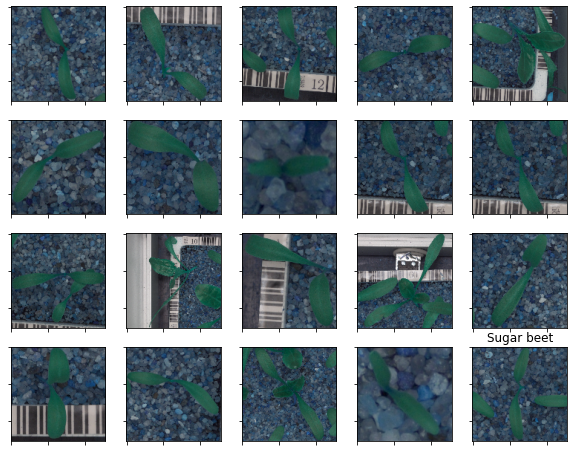

Printing images of Maize
Indices of plant-image Maize are in the range : 3612 3832 . Samples:
[3614 3636 3641 3642 3649 3650 3655 3668 3684 3702 3710 3719 3741 3754
 3769 3779 3783 3797 3807 3814]


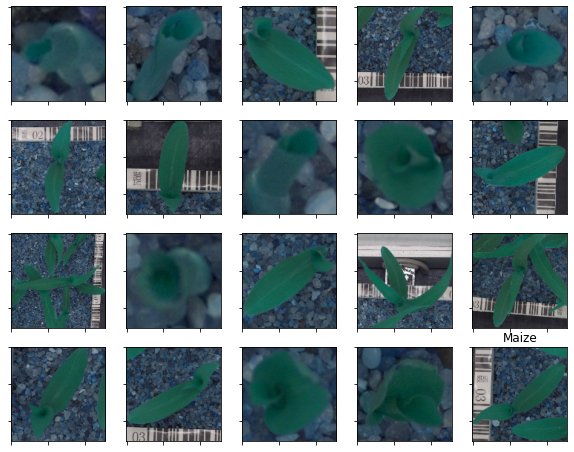

Printing images of Black-grass
Indices of plant-image Black-grass are in the range : 3833 4095 . Samples:
[3848 3849 3863 3865 3866 3888 3904 3918 3919 3933 3934 3944 3957 3961
 3965 3974 4011 4033 4085 4094]


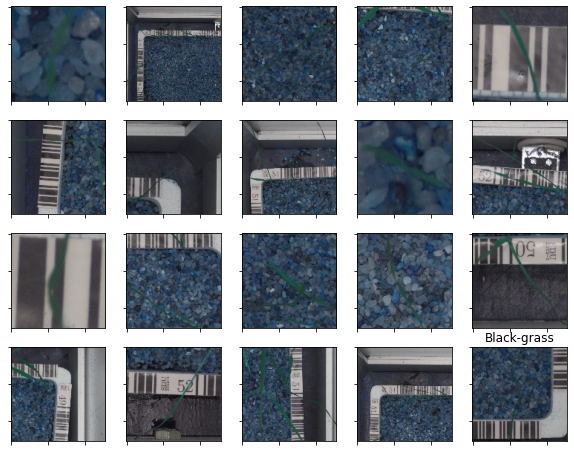

Printing images of Loose Silky-bent
Indices of plant-image Loose Silky-bent are in the range : 4096 4749 . Samples:
[4104 4130 4203 4216 4223 4226 4274 4278 4303 4325 4332 4354 4454 4470
 4489 4490 4508 4587 4611 4654]


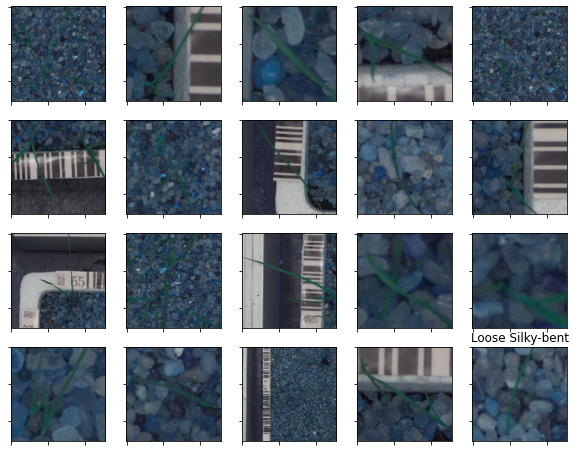

CPU times: user 28.4 s, sys: 351 ms, total: 28.7 s
Wall time: 28.6 s


[None, None, None, None, None, None, None, None, None, None, None, None]

In [85]:
%%time

# Plot every class of plants
[plot_for_class(i, df_labels, img) for 
 i in list(pd.unique(df_labels["Label"])) ]

### Observation by Sanjib:

1. All the plants are of color Green. The color plays a significant role in identifying object; hence, converting the images into Grayscale is not a good idea.
2. The backgounds are having sharp gradients sometimes. Every type of plants have various backgrounds. The backgrounds contain no information to classify the plants.
3. The shape of each class of plants are distinct.
4. The blurness of the images varies.  
5. The plan objects are sometimes near the boudaries of the images. Padding would be a good idea. 

(128, 128, 3) Original image layers on colors B,G,R


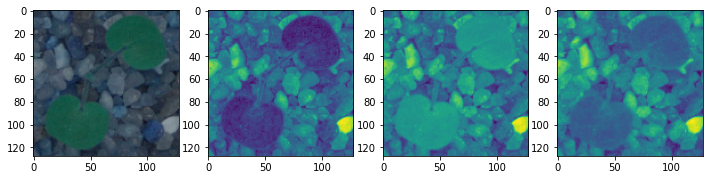

In [86]:


def numeric_plot_image (image_array):
  """
    Description : Plots layers of the image
    Parameter :
      image_array : np.array = image in the form of numeric array
  """

  fig, axs = plt.subplots(1, 4, figsize=(12, 12))
  # im = ax.imshow(image_array)

  print(image_array.shape, "Original image layers on colors B,G,R")
  axs[ 0].imshow(image_array)

  for j in range(0, 3): # R G B seperate plot      
      axs[ j+1].imshow(image_array[:,:,j])

  plt.show()  

# Testing the function
numeric_plot_image(img[100])  

[3356, 3727, 3243, 1739, 2877, 2891, 648, 4520, 4706, 1911]
(128, 128, 3) Original image layers on colors B,G,R


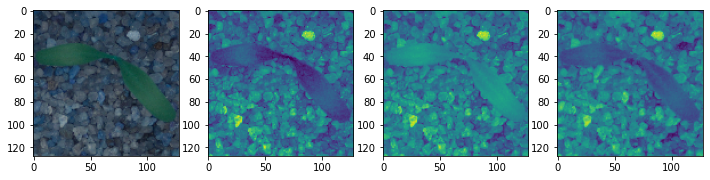

(128, 128, 3) Original image layers on colors B,G,R


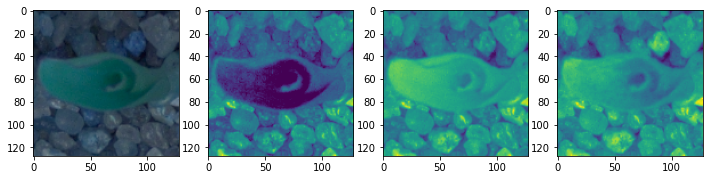

(128, 128, 3) Original image layers on colors B,G,R


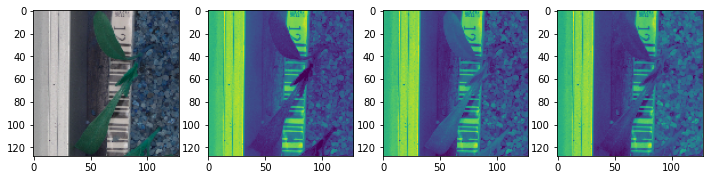

(128, 128, 3) Original image layers on colors B,G,R


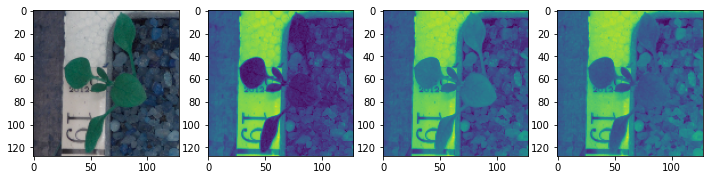

(128, 128, 3) Original image layers on colors B,G,R


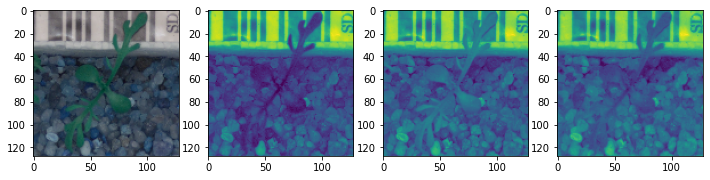

(128, 128, 3) Original image layers on colors B,G,R


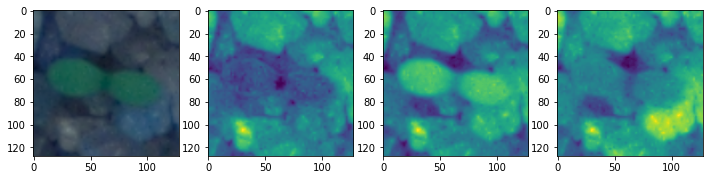

(128, 128, 3) Original image layers on colors B,G,R


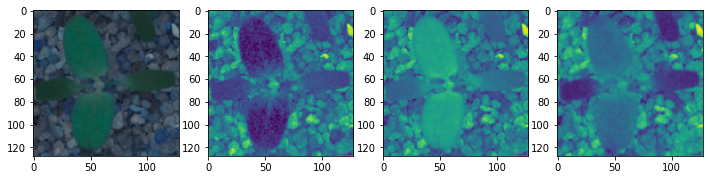

(128, 128, 3) Original image layers on colors B,G,R


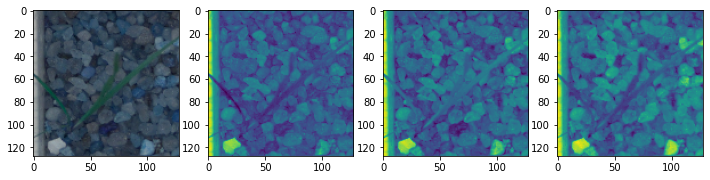

(128, 128, 3) Original image layers on colors B,G,R


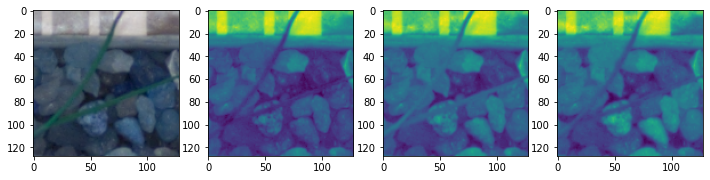

(128, 128, 3) Original image layers on colors B,G,R


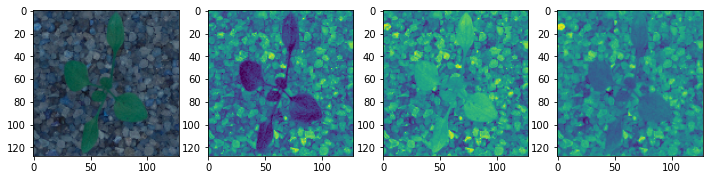

CPU times: user 6.48 s, sys: 114 ms, total: 6.6 s
Wall time: 6.58 s


In [87]:
%%time 

# Plot random 10 plants in color filters
random_index = list(np.random.choice(np.arange(img.shape[0]),10))
print(random_index)
for i in random_index:
  numeric_plot_image(img[i])

## 2.1 Mean Image of each Image-class and Contrast Difference

Note : By observing the images above, the plants are located in various positions of the images (row, column). Hence the mean image may not be displayed as a plant.

Mean Imgage of Small-flowered Cranesbill (128, 128, 3)


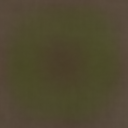

In [88]:
# Reusable Function
def find_mean_img(full_mat, title):
    """
      Description:
        Find the mean image
      Parameters:
        full_mat : np.array =  Tensor of the image
        title : str = Title of Image
      Return:
        1. mean_img : np.array 
        2. display in the Notebook

    """
    # calculate the average
    mean_img = np.mean(full_mat, axis = 0)
    # reshape it back to a matrix
    mean_img = mean_img.reshape((128,128,3))
    print("Mean Imgage of", title, mean_img.shape)

    cv2_imshow(mean_img)

    return mean_img




# Unit testing of the function
mean_img = find_mean_img(img[0:495,:,:,:], "Small-flowered Cranesbill")

Mean Imgage of Small-flowered Cranesbill (128, 128, 3)


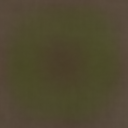

Mean Imgage of Fat Hen (128, 128, 3)


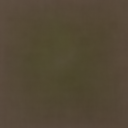

Mean Imgage of Shepherds Purse (128, 128, 3)


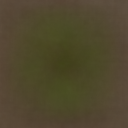

Mean Imgage of Common wheat (128, 128, 3)


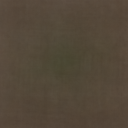

Mean Imgage of Common Chickweed (128, 128, 3)


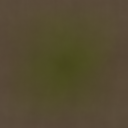

Mean Imgage of Charlock (128, 128, 3)


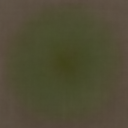

Mean Imgage of Cleavers (128, 128, 3)


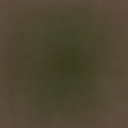

Mean Imgage of Scentless Mayweed (128, 128, 3)


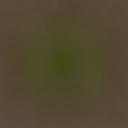

Mean Imgage of Sugar beet (128, 128, 3)


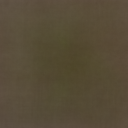

Mean Imgage of Maize (128, 128, 3)


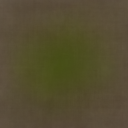

Mean Imgage of Black-grass (128, 128, 3)


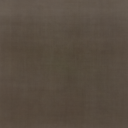

Mean Imgage of Loose Silky-bent (128, 128, 3)


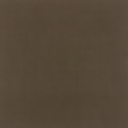

CPU times: user 455 ms, sys: 16.1 ms, total: 471 ms
Wall time: 494 ms


In [89]:
%%time
mean_img_array = []


# Plot every class of plants
for label in list(pd.unique(df_labels["Label"])) :
  label_indexes = df_labels[ df_labels["Label"] == label ].index  
  mean_img_array.append( 
      find_mean_img(img[np.amin(label_indexes):np.amax(label_indexes),:,:,:], 
      label) )

### Observation by Sanjib:

1. The "Black-grass" and "Loose Silky-bent" has less green area in mean image because they are thin plants, as observed previously.
2. The "Maize", "Scentless Mayweed", "Shepherds Purse" and "Common Chickweed" has more green area in mean image they are wider and compact green plants, as observed previously.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


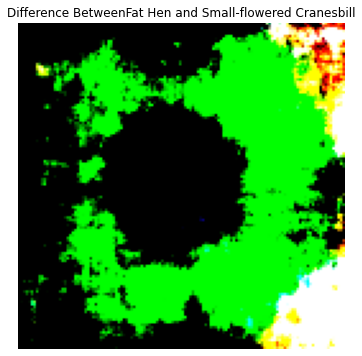

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


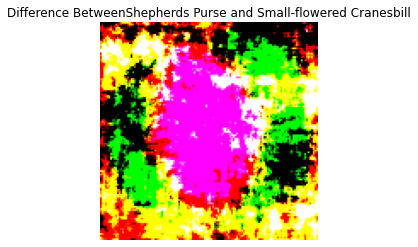

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


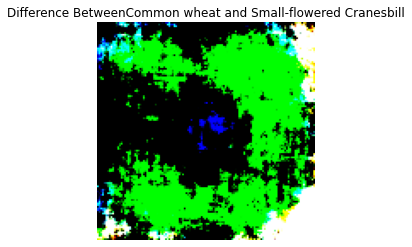

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


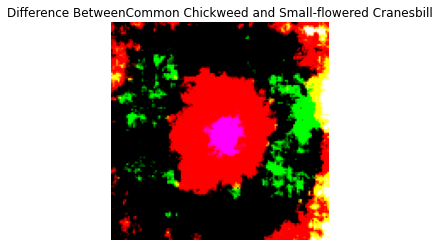

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


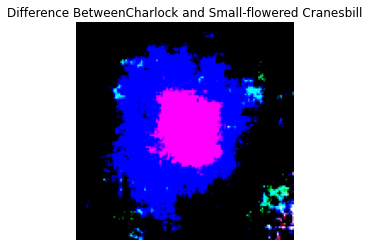

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


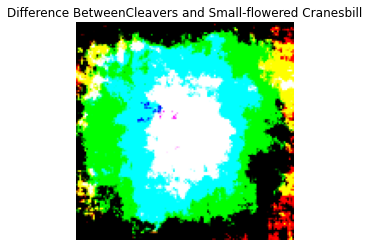

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


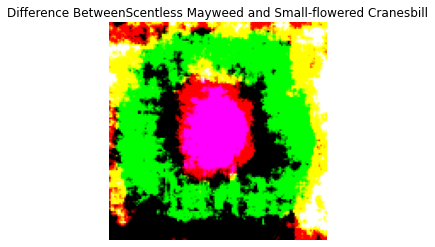

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


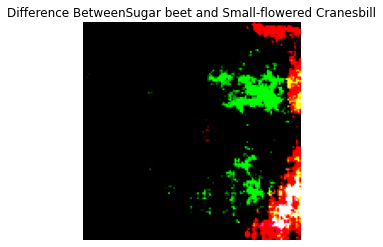

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


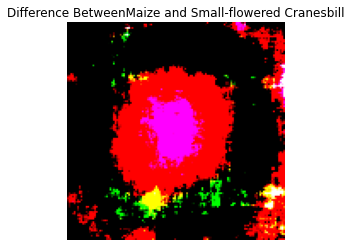

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


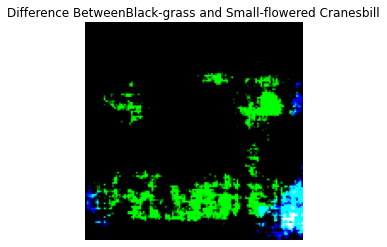

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


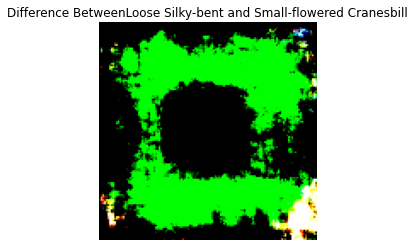

In [90]:
# %%time

fig = plt.figure(figsize = (8,6))

image_classes = list(pd.unique(df_labels["Label"]))
n=0

# Contrast with "Small-flowered Cranesbill"
for i in mean_img_array:
  if n >0 :
      # contrast_mean = np.mod(mean_img_array[0], i)
      contrast_mean = mean_img_array[0] - i
      plt.imshow(contrast_mean, 
                 cmap='bwr')

      plt.title('Difference Between' + 
                image_classes[n] +
                ' and Small-flowered Cranesbill')

      
      plt.axis('off')
      plt.show()

  n += 1     

### Observation by Sanjib :

1. ?? The black area represents no difference (0 value) between mean imgages. More black area in contrast signify similarity between mean images.

#3. Data Processing

3.1 Gaussian Blurring

3.2 Noralization

3.3 On Hot Encoding

##3.1 Gaussian Blurring

Gaussian Blurring: Gaussian blur is the result of blurring an image by a Gaussian function.
It is a widely used effect in graphics software, typically to reduce image noise and reduce detail. It is also used as a preprocessing stage before applying our machine learning or deep learning models.

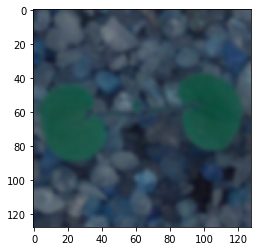

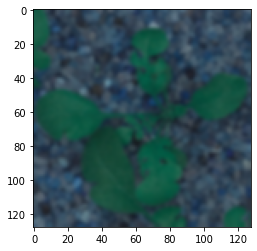

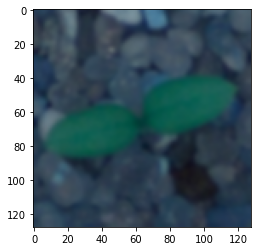

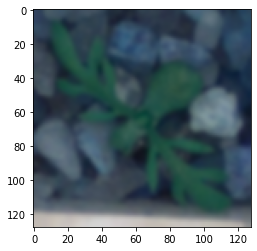

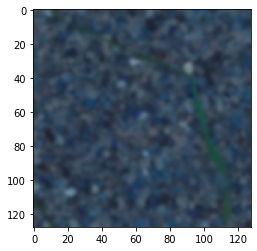

In [91]:
images_Gaussian = copy.deepcopy(img)

for i in range( img.shape[0] ):
  images_Gaussian[i] = cv2.GaussianBlur(img[i], (5, 5), 0)
  if i % 1000 == 0: # Show every 1000th image only
    plt.imshow(images_Gaussian[i] )
    plt.show()

##3.2 Normalization

Bringing pixel values in the range [0 : 1]

In [92]:
## Normalizing pixel values  
imgages_Gaussian_normalized = images_Gaussian/255.0
imgages_Gaussian_normalized[100] # print sample of 100th image

array([[[0.17254902, 0.22352941, 0.28627451],
        [0.16862745, 0.21960784, 0.28235294],
        [0.16470588, 0.21176471, 0.27058824],
        ...,
        [0.18823529, 0.28627451, 0.34117647],
        [0.15686275, 0.23529412, 0.29019608],
        [0.14509804, 0.21176471, 0.27058824]],

       [[0.17254902, 0.22352941, 0.28627451],
        [0.16862745, 0.21960784, 0.27843137],
        [0.16078431, 0.21176471, 0.27058824],
        ...,
        [0.18431373, 0.28627451, 0.34509804],
        [0.15686275, 0.23921569, 0.29803922],
        [0.14509804, 0.21568627, 0.2745098 ]],

       [[0.16470588, 0.22352941, 0.28235294],
        [0.16078431, 0.21568627, 0.2745098 ],
        [0.15294118, 0.20784314, 0.26666667],
        ...,
        [0.18039216, 0.29019608, 0.36078431],
        [0.15686275, 0.24705882, 0.31372549],
        [0.14901961, 0.23137255, 0.29411765]],

       ...,

       [[0.27843137, 0.3372549 , 0.40392157],
        [0.27058824, 0.32941176, 0.4       ],
        [0.25098039, 0

##3.3 One Hot Encoding


In [108]:
# The classes of Images
df_labels.value_counts()


Label                    
Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Maize                        221
Common wheat                 221
dtype: int64

In [113]:

# Convert the classes into integers
df_int_labels =  df_labels["Label"].replace(
              {"Loose Silky-bent" : 0,
               "Common Chickweed" : 1,
               "Scentless Mayweed" : 2,
               "Small-flowered Cranesbill" : 3,
               "Fat Hen" : 4,
               "Charlock" : 5,
               "Sugar beet" : 6,
               "Cleavers" : 7,
               "Black-grass" : 8,
               "Shepherds Purse" : 9,
               "Maize" : 10,
               "Common wheat" : 11
               }).astype("uint8")
df_int_labels.value_counts()

0     654
1     611
2     516
3     496
4     475
5     390
6     385
7     287
8     263
9     231
11    221
10    221
Name: Label, dtype: int64

In [114]:

#One Hot encoding
y_encoded = to_categorical(df_int_labels.to_numpy())
y_encoded.shape

(4750, 12)

In [118]:
#Display encoded values
pd.DataFrame(y_encoded)

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...
4745,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4746,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4747,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4748,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


#4. Data Split into Train, Test, Validation 

 Split the dataset into training, testing, and validation set. (Hint: First split images and labels into training and testing set with test_size = 0.3. Then further split test data into test and validation set with test_size = 0.5)